In [ ]:
import os
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from scipy import constants

from sklearn.preprocessing import normalize, MinMaxScaler, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, \
mean_squared_log_error, mean_absolute_percentage_error
from sklearn.decomposition import PCA, IncrementalPCA

from catboost import CatBoostRegressor, sum_models

from typing import Any, Union, Optional, Text, Dict, Tuple, List, Callable, Type
from random import sample

import optuna
from optuna.visualization.matplotlib import plot_param_importances
from optuna.visualization import plot_optimization_history

import yaml
import json
import joblib

import warnings
warnings.filterwarnings("ignore")

from tqdm.auto import tqdm

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Описание задачи

https://www.kaggle.com/competitions/icecube-neutrinos-in-deep-ice

<b>IceCube</b> — нейтринная обсерватория, построенная на антарктической станции Амундсен-Скотт. IceCube расположен глубоко в толще антарктического льда. На глубине от 1450 до 2450 м помещены прочные «нити» с прикреплёнными оптическими детекторами (фотоумножителями). Каждая «нить» имеет 60 фотоумножителей - всего 5160 сенсоров. Оптическая система регистрирует излучение мюонов высокой энергии, движущихся в направлении вверх (то есть из-под земли). Эти мюоны могут рождаться только при взаимодействии мюонных нейтрино, прошедших сквозь Землю, с электронами и нуклонами льда (и слоя грунта подо льдом, толщиной порядка 1 км).<br><br>

<div>
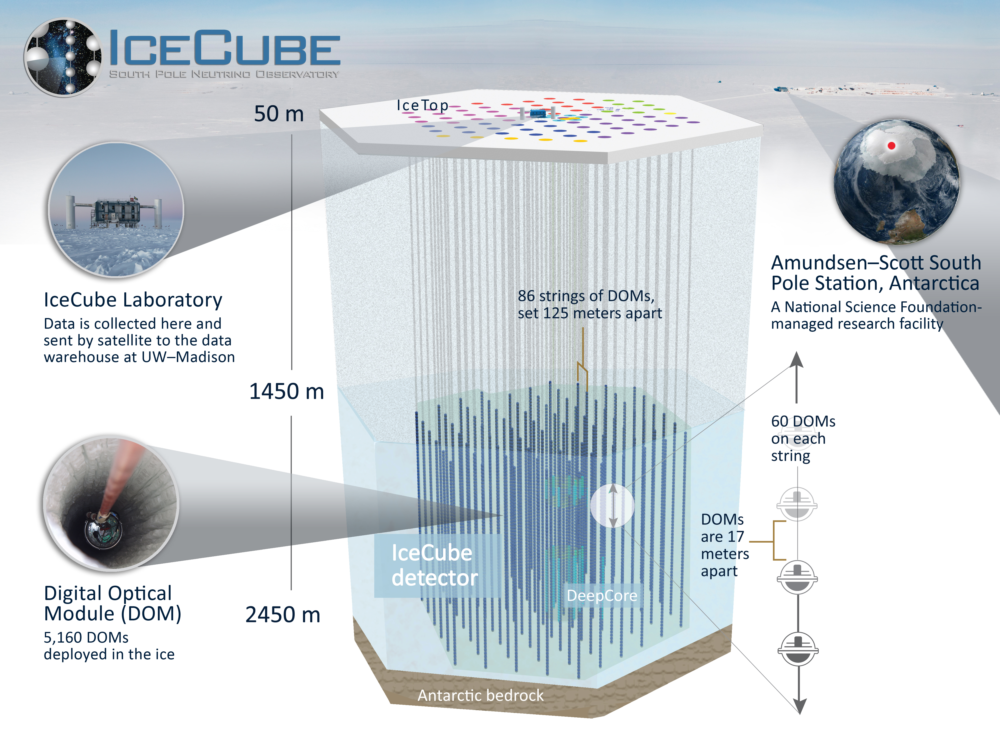
</div>
<br>

Необходимо определить, с какого направления пришли нейтрино, обнаруженные нейтринной обсерваторией IceCube на основании информации от фотодетекторов, зафиксировавших излучение. В качестве исходных данных имеются координаты фотодатчиков обсерватории (<b>sensor_geometry.csv</b>), результаты прошлых исследований с расчетом сферических координат векторов движения нейтрино (<b>train_meta.parquet, batch_N.parquet</b>)

<b>Данные для обучения:</b></br>
<u><b>sensor_geometry.csv</b></u> - информация с координатами фотодатчиков обсерватории:<br>
<ul>
    <li><b>sensor_id</b> - идентификатор фотодатчика</li>
    <li><b>x, y, z</b> - координаты фотодатчиков в декартовой системе в метрах</li>
</ul>
<u><b>batch_N.parquet</b></u> - наблюдения последовательностями фиксациий лучей нейтрино фотодатчиками, объединенные в пакетные датасеты (batch). N ${\in}$ [1, 660]:<br>
<ul>
    <li><b>event_id</b> - идентификатор события. В каждое событие входит несколько строк по числу фотодатчиков, обнаруживших излучение </li>
    <li><b>sensor_id</b> - идентификатор фотодатчика, зафиксировавшего излучение (импульс)</li>
    <li><b>time</b> - момент времени импульса в наносекундах в рамках текущего события (относительное время)</li>
    <li><b>charge</b> - величина импульа нейтрино</li>
    <li><b>auxiliary</b> - флаг того, что измерение не было полностью оцифровано и имеет низкое качество или соответствует шуму</li>
</ul>
<u><b>train_meta.parquet</b></u> / <u><b>test_meta.parquet</b></u> - сводная таблица наблюдений, каждая строка которой представляет одно наблюдение из датасетов <b>batch_N.parquet</b> с расчетом направления луча нейтрино:<br>
<ul>
    <li><b>batch_id</b> - идентификатор пакета событий. Соотносится с номером <b>N</b> файлов <b>batch_N.parquet</b></li>
    <li><b>event_id</b> - идентификатор события. В каждое событие входит несколько строк по числу фотодатчиков, обнаруживших излучение </li>
    <li><b>first_pulse_index</b> - сквозной номер первой фиксации излучения нейтрино (импульс) в рамках одного события <b>(event_id)</b></li>
    <li><b>last_pulse_index</b> - сквозной номер последней фиксации излучения нейтрино (импульс) в рамках одного события <b>(event_id)</b></li>
    <li><b>azimuth ($\phi$)</b> - расчетный угол азимута луча появления нейтрино в радианах [0, 2${\pi}$], отсутствует в <b>test_meta.parquet</b></li>
    <li><b>zenith ($\theta$)</b> - расчетный угол зенита луча появления нейтрино в радианах [0, ${\pi}$], отсутствует в <b>test_meta.parquet</b></li>
    
<b>azimuth, zenith</b> - целевые переменные

<div>
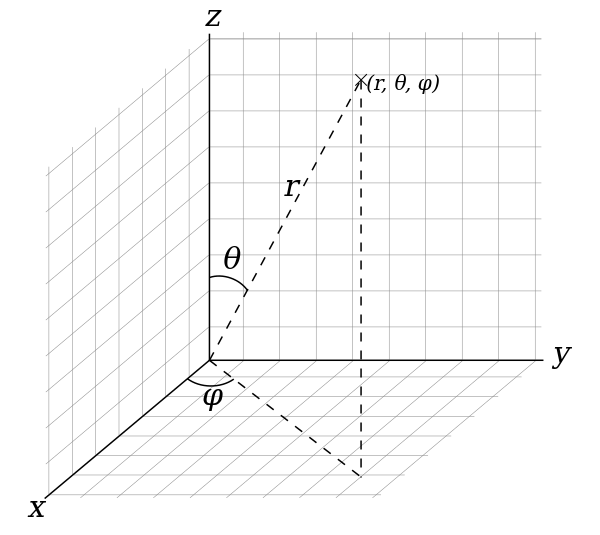
</div>
<br>

<a href="https://www.youtube.com/watch?v=3PZgfPHULHw">Видео, иллюстрирующее фиксацию нейтрино (одно событие)</a>

<b>Данные для теста:</b></br>
<u><b>batch_661.parquet</b></u> - пакет событий № 661 - тестовый, формат аналогичен предыдушим датасетам. Метаданные содержатся в <b>test_meta.parquet</b>

In [ ]:
config_path = '../config/params.yml'
config = yaml.load(open(config_path), Loader=yaml.FullLoader)

preproc = config['preprocessing']
training = config['train']
evaluate = config['evaluate']

In [ ]:
preproc

In [ ]:
training

In [ ]:
evaluate

In [ ]:
# Доступ к данным из Kaggle через API
with open(preproc['kaggle_creds']) as json_file:
    kaggle_creds = json.load(json_file)

In [ ]:
os.environ['KAGGLE_USERNAME'] = kaggle_creds['username']
os.environ['KAGGLE_KEY'] = kaggle_creds['key']

In [ ]:
file_dirs = preproc['file_dirs'] | evaluate['file_dirs']

In [ ]:
def file_download(filename: str, local_filepath: str,
                  kaggle_filepath: str) -> None:
    """
    Загрузка файлов с репозитория Kaggle
    :param filename: имя файла с расширением
    :param local_filepath: директория проекта, куда следует загрузить файл
    :param kaggle_filepath: директория ресурса kaggle, где файл размещен
    """
    check_file = os.path.isfile(local_filepath + filename)
    if not check_file:
        print(f'File {filename} download operation from {kaggle_filepath}')
        shell_cmd = f"""
        cd {local_filepath}
        kaggle competitions download -c {preproc['kaggle_competition']} -f {kaggle_filepath + filename}
        unzip {filename}
        rm {filename}.zip
        """
        os.system(shell_cmd)
        print(f'File {filename} has been downloaded and unzipped')
    else:
        print(f'File {filename} exists in {local_filepath}. Skipping download')

In [ ]:
def file_delete(filename: str, path: str) -> None:
    """
    Удаление файла
    :param filename: имя файла с расширением
    :param path: директория проекта, где расположен файл
    """
    check_file = os.path.isfile(path + filename)
    if check_file:
        print(f'Deleting file {path}{filename}')
        shell_cmd = f"""
        cd {path}
        rm {filename}
        """
        os.system(shell_cmd)
        print(f'File {path}{filename} has been removed')
    else:
        print(f'File {filename} does not exist in {path}. Skipping deletion')

In [ ]:
# Загружаем тренировочные и тестовые файлы
for file in file_dirs.keys():
    local_filepath = file_dirs[file]['local_dir']
    kaggle_filepath = file_dirs[file]['kaggle_dir']
    if 'ids' in file_dirs[file]:
        for batch_id in range(int(file_dirs[file]['ids'][0]),
                              int(file_dirs[file]['ids'][1]) + 1):
            filename = file_dirs[file]['filename'].format(batch_id=batch_id)
            file_download(filename=filename,
                          local_filepath=local_filepath,
                          kaggle_filepath=kaggle_filepath)
    else:
        filename = file_dirs[file]['filename']
        file_download(filename=filename,
                      local_filepath=local_filepath,
                      kaggle_filepath=kaggle_filepath)

# EDA

## Геометрия оптических нитей IceCube

In [ ]:
file_path = preproc['file_dirs']['sensor_geometry'][
    'local_dir'] + '/' + preproc['file_dirs']['sensor_geometry']['filename']
sensor_geometry = pd.read_csv(file_path)
del file_path

In [ ]:
sensor_geometry.head()

In [ ]:
sensor_geometry.info()

In [ ]:
sensor_geometry.describe()

In [ ]:
sensor_geometry.head()

In [ ]:
fig = px.scatter_3d(sensor_geometry,
                    x='x',
                    y='y',
                    z='z',
                    color=sensor_geometry.index,
                    opacity=0.7)
fig.update_traces(marker_size=2)
fig.show()

In [ ]:
def sg_transform(df: pd.DataFrame) -> pd.DataFrame:
    """
    Получение данных об их принадлежности к нитям
    :param df: датафрейм sensor_geometry
    """
    df_out = df.copy()
    # Номер нити, к которой относится датчик
    df_out[preproc['line_column']] = df_out[preproc['sensor_column']] // 60 + 1
    # Флаг принадлежности датчика к центральным нитям
    #df['core'] = (df['line_id'] > 78).astype('uint8')

    return df_out

In [ ]:
sg_transform(sensor_geometry).head()

Рассчитаем максимально возможное теоретическое время одного события в наносек.(нс):

In [ ]:
min_coordinate = np.array([
    min(sensor_geometry['x']),
    min(sensor_geometry['y']),
    min(sensor_geometry['z'])
])
max_coordinate = np.array([
    max(sensor_geometry['x']),
    max(sensor_geometry['y']),
    max(sensor_geometry['z'])
])
dist = np.linalg.norm(max_coordinate - min_coordinate)
valid_time = dist / constants.speed_of_light * 1e9
print(
    f'Теоретическое время прохождения аппарата IceCube одним нейтрино: {np.round(valid_time)} (нс)'
)

## Данные прошлых наблюдений

In [ ]:
file_path = preproc['file_dirs']['train_meta'][
    'local_dir'] + '/' + preproc['file_dirs']['train_meta']['filename']
train_meta = pd.read_parquet(file_path)
del file_path

In [ ]:
train_meta.head()

In [ ]:
train_meta.info()

In [ ]:
train_meta.describe()

Выполним преобразование int64 и float64 к меньшим по разрядности типам для экономии ресурсов

In [ ]:
def dtypes_convert(df: pd.DataFrame) -> pd.DataFrame:
    """
    Преобразование числовых полей датафрейма к меньшей размерности для экономии вычислительных ресурсов
    :param df: датафрейм
    """
    fcols = df.select_dtypes('float').columns
    icols = df.select_dtypes('integer').columns

    df[fcols] = df[fcols].apply(pd.to_numeric, downcast='float')
    df[icols] = df[icols].apply(pd.to_numeric, downcast='unsigned')
    
    return df

In [ ]:
train_meta = dtypes_convert(train_meta)

In [ ]:
plt.hist2d(train_meta['azimuth'], train_meta['zenith'], bins=(50, 50), cmap='jet')
plt.xlabel('azimuth'), plt.ylabel('zenith')
plt.colorbar();

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: наибольшая часть событий фиксируется с углом зенита примерно 1,5 ~= (${\pi}/2$), т.е. в вертикальном направлении. Распределение по азимуту достаточно равномерное
</div>

In [ ]:
file_path = preproc['file_dirs']['train_batches']['local_dir'] + '/' + preproc[
    'file_dirs']['train_batches']['filename'].format(batch_id=1)
batch_1 = pd.read_parquet(file_path)
del file_path

In [ ]:
batch_1.head()

In [ ]:
batch_1.info()

In [ ]:
batch_1.describe()

In [ ]:
batch_1 = dtypes_convert(batch_1)

In [ ]:
print(f'Number of events: {batch_1.index.nunique()}')

Распределение измеряемого заряда по всем событиям: 

In [ ]:
fig = plt.figure(figsize=(10, 5))
plt.hist(batch_1['charge'], log=True)
plt.ylabel('Measurements count')
plt.xlabel('Charge value');

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: наибольшая часть импульсов фиксируются с величиной до 500 p.e.
</div>

Распределение категории измерений (auxiliary):

In [ ]:
batch_1_norm = (batch_1['auxiliary']
               .value_counts(normalize=True)
               .mul(100)
               .rename('percent')
               .reset_index())

In [ ]:
plt.figure(figsize=(10, 5))
ax = sns.barplot(x=batch_1_norm.index, y='percent', data=batch_1_norm)

for p in ax.patches:
    percentage = '{:.1f}%'.format(p.get_height())
    ax.annotate(percentage,
                (p.get_x() + p.get_width() / 2., p.get_height()),  
                ha='center', 
                va='center',
                xytext=(0, 10),
                textcoords='offset points', 
                fontsize=10)

plt.title('Auxiliary percentage', fontsize=12)
plt.xlabel('Auxiliary', fontsize=10)
plt.ylabel('Percent', fontsize=10)
plt.ylim((0,100))


plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

In [ ]:
del batch_1_norm

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: наибольшая часть импульсов относятся к категории основных (не вспопогательных)
</div>

Проверим зависимость между признаками категории измерений (auxiliary) и величиной заряда (charge)

In [ ]:
plt.figure(figsize=(15, 5))
sns.boxplot(x='charge',
            y='auxiliary',
            data=batch_1,
            palette='rocket',
            orient='h')

plt.title('Boxplot Charge - Auxiliary', fontsize=14)
plt.xscale('log')
plt.ylabel('Auxiliary', fontsize=12)
plt.xlabel('Charge', fontsize=12);

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: у измерений с признаком auxiliary == <b>False</b> величина заряда как правило фиксируется выше, чем у измерений с auxiliary == <b>True</b>
</div>

Проверим распределение величины окна времени событий:

In [ ]:
batch_1_events = batch_1.groupby('event_id').agg({'time': ['min', 'max']})
batch_1_events = batch_1_events.set_axis(['min_time', 'max_time'], axis=1)

In [ ]:
batch_1_events['time_delta'] = batch_1_events['max_time'] - batch_1_events['min_time']

In [ ]:
plt.figure(figsize=(10, 3))
sns.histplot(batch_1_events['time_delta'], kde=True, log_scale=False)
plt.axvline(x=valid_time, ymin=0, ymax=1, linestyle='--', color='darkgreen')
plt.text(x=(valid_time - 600), y=1500, s='Valid time', rotation=90)
plt.title('Event time distribution', fontsize=12)
plt.ylabel('Events count', fontsize=10)
plt.xlabel('Time window', fontsize=10)
plt.show()

In [ ]:
del batch_1_events

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: временное окно существенного большинства событий значительно превышает максимальное время, рассчитанное, исходя из геометрии измерительных нитей
</div>

In [ ]:
def spherical_to_cartesian(spherical: np.ndarray) -> np.ndarray:
    """
    Преобразование вектора сферических координат в декартову систему координат
    :param spheric: масив сферических координат в формате [azimuth, zenith]
    """
    azimuth = spherical[:, 0]
    zenith = spherical[:, 1]
    dx = np.sin(zenith) * np.cos(azimuth)
    dy = np.sin(zenith) * np.sin(azimuth)
    dz = np.cos(zenith)

    return np.array([dx, dy, dz]).T

In [ ]:
def cartesian_to_spherical(cart: np.ndarray) -> np.ndarray:
    """
    Обратное преобразование вектора декартовых координат в сферическую систему
    :param cart: масив сферических координат в формате [x, y, z]
    """
    x = cart[:, 0]
    y = cart[:, 1]
    z = cart[:, 2]
    rxy_sq = x**2 + y**2
    r = np.sqrt(rxy_sq + z**2)
    zenith = np.arctan2(np.sqrt(rxy_sq), z)
    zenith = np.where(zenith < 0, zenith + 2 * np.pi, zenith)
    azimuth = np.arctan2(y, x)
    azimuth = np.where(azimuth < 0, azimuth + 2 * np.pi, azimuth)
    
    return np.array([azimuth, zenith], dtype='float32').T

In [ ]:
def charge_normalize(df_event: pd.DataFrame) -> np.ndarray:
    """
    Вычисление средневзвешенных по значениям импульсов координат срабатывания фотодатчиков 
    в рамках одного события. Используется для вычисления опорных координат луча нейтрино
    :param df_event: датафрейм с импульсами одного события с координатами датчиков, 
    зафиксировавших импульс
    """
    df_event_sub = df_event[['x', 'y', 'z', 'charge']]
    # Вычисляем весовой коэффициент каждого импульса
    df_event_sub.loc[:, 'coef'] = df_event_sub['charge'] / df_event_sub[
        'charge'].sum()
    for ax in ['x', 'y', 'z']:
        df_event_sub.loc[:, ax] *= df_event_sub['coef']
    cn = df_event_sub[['x', 'y', 'z']].sum()
    return np.array(cn)

In [ ]:
def draw_subplot(fig: go.Figure,
                 ax_num: int,
                 event_pulses_: pd.DataFrame,
                 sensor_geometry: pd.DataFrame,
                 mc: np.ndarray,
                 c_ray: np.ndarray,
                 scale: float = 400):
    """
    Построение 3D-графика импульсов и расчетного вектора события, отфильтрованных по признаку 
    auxiliary и наложенных на геометрическую модель фотодатчиков, в объекте 
    plotly.graph_objs.Figure
    :param fig: объект plotly.graph_objs.Figure
    :param ax_num: идентификатор объекта 3D-графика: 0 для aux == False и 1 для aux == True
    :param event_pulses_: датафрейм с импульсами одного события, отфильтрованными по признаку aux
    :param sensor_geometry: датафрейм с координатами фотодатчиков IceCube
    :param mc: массив декартовых координат X, Y, Z по значениям импульсов срабатывания фотодатчиков 
    :param ray: массив значений декартовых координат X, Y, Z расчетного вектора события
    :param scale: коэффициент масштабирования длины вектора на графике
    """
    # отрисовываем все фотодатчики IceCube в виде фона
    fig.add_trace(go.Scatter3d(x=sensor_geometry['x'],
                               y=sensor_geometry['y'],
                               z=sensor_geometry['z'],
                               name=None,
                               showlegend=False,
                               mode='markers',
                               marker=dict(size=1, color='black'),
                               opacity=0.2),
                  col=(ax_num + 1),
                  row=1)
    # отрисовываем фотодатчики, зафиксировавшие имульсы
    fig.add_trace(go.Scatter3d(x=event_pulses_['x'],
                               y=event_pulses_['y'],
                               z=event_pulses_['z'],
                               name=None,
                               showlegend=False,
                               opacity=0.8,
                               mode='markers',
                               marker=dict(size=event_pulses_['charge'] * 15,
                                           color=event_pulses_['time'],
                                           colorscale='turbo',
                                           showscale=True)),
                  col=(ax_num + 1),
                  row=1)
    # рисуем расчетный вектор события
    fig.add_trace(go.Scatter3d(
        x=[mc[0] - c_ray[0] * scale, mc[0] + c_ray[0] * scale],
        y=[mc[1] - c_ray[1] * scale, mc[1] + c_ray[1] * scale],
        z=[mc[2] - c_ray[2] * scale, mc[2] + c_ray[2] * scale],
        name='target',
        showlegend=not bool(ax_num),
        opacity=0.8,
        mode='lines+markers',
        marker=dict(size=5, symbol=['cross', 'circle-open']),
        line=dict(color='red', width=3)),
                  col=(ax_num + 1),
                  row=1)

In [ ]:
def event_plot(event_id: int,
               batch_data: pd.DataFrame,
               sensor_geometry: pd.DataFrame = sensor_geometry,
               train_meta: pd.DataFrame = train_meta) -> go.Figure:
    """
    Создание 3D-графика импульсов и расчетного вектора события для сравнения имульсов 
    с признаком auxiliary == True и False
    :param event_id: идентификатор события
    :param batch_data: датасет событий измерения импульсов нейтрино с детализацией импульсов
    :param sensors_geometry: датасет с координатами фотодатчиков
    :param train_meta: датафрейм с метаданными событиий с расчетными векторами направления нейтрино 
    в сферических координатах
    """
    # Выбираем нужное событие из метаданных
    event_metadata = dict(train_meta[train_meta.index == event_id].iloc[0])
    azimuth = event_metadata['azimuth']
    zenith = event_metadata['zenith']
    # Выбираем импульсы, соответствующие запрошенному событию
    event_pulses = batch_data[batch_data.index == event_id]
    # Накладываем на датасет с импульсами координаты фотодатчиков
    event_pulses = event_pulses.reset_index().merge(
        sensor_geometry, on=preproc['sensor_column'], how='left')
    event_pulses.loc[:, 'charge'] /= event_pulses['charge'].max()
    # Единичные координаты вектора луча нейтрино
    c_ray = spherical_to_cartesian(np.array([[azimuth, zenith]]))

    auxiliaries = [False, True]
    fig = make_subplots(
        cols=2,
        specs=[[{
            'type': 'scene'
        }, {
            'type': 'scene'
        }]],
        subplot_titles=[f'auxiliary={aux}' for aux in auxiliaries],
        horizontal_spacing=0.1,
    )

    for i, aux in enumerate(auxiliaries):
        event_pulses_ = event_pulses[event_pulses['auxiliary'] == aux]
        mc = charge_normalize(
            df_event=event_pulses[event_pulses['auxiliary'] == aux])
        draw_subplot(fig, i, event_pulses_, sensor_geometry, mc, c_ray[0])

    fig.update_layout(
        height=500,
        width=1000,
        showlegend=True,
        legend=dict(y=-0.1, x=0.5),
        title_text=f"Event #{event_id}"
        f" / azimuth={azimuth:0.3}; zenith={zenith:0.3}\n"
        f"-> x={mc[0]:0.2}; y={mc[1]:0.2}; z={mc[2]:0.2}",
    )
    return fig

In [ ]:
fig = event_plot(event_id=67,
                 batch_data=batch_1,
                 sensor_geometry=sensor_geometry,
                 train_meta=train_meta)
fig.show()

## Гипотезы

### Вспомогательные импульсы не оказывают существенного влияния на целевые переменные

In [ ]:
def get_pca_vector(df: pd.DataFrame) -> np.ndarray:
    """
    Расчет координат собственного вектора матрицы
    :param df: датафрейм матрицы
    """
    df = df[preproc['coordinate_columns']]
    pca = PCA(n_components=1, random_state=preproc['random_state'])
    pca.fit(df)
    pca_vector = pca.components_[0]
    
    return pca_vector

In [ ]:
def event_plot_calc(event_id: int = 24,
                    batch_data: pd.DataFrame = batch_1,
                    sensor_geometry: pd.DataFrame = sensor_geometry,
                    train_meta: pd.DataFrame = train_meta,
                    func: Callable = get_pca_vector,
                    scale: float = 400) -> go.Figure:
    """
    Создание 3D-графика импульсов, расчетного вектора события и собственного вектора 
    для подмножества импульсов с признаком auxiliary == True и auxiliary == False
    :param event_id: идентификатор события
    :param batch_data: датасет событий измерения импульсов нейтрино с детализацией импульсов
    :param sensor_geometry: датасет с координатами фотодатчиков
    :param train_meta: метаданные событиий с векторами направления нейтрино в сферических координатах
    :param scale: коэффициент масштабирования для отрисовки луча нейтрино
    """
    event_pulses = batch_1[batch_1.index ==
                           event_id].reset_index().merge(
                               sensor_geometry,
                               on=preproc['sensor_column'],
                               how='left')
    auxiliaries = [False, True]
    fig = event_plot(event_id=event_id,
                     batch_data=batch_1,
                     sensor_geometry=sensor_geometry,
                     train_meta=train_meta)

    for i, aux in enumerate(auxiliaries):
        event_pulses_ = event_pulses[event_pulses['auxiliary'] == aux]
        event_vector = func(df=event_pulses_)
        mc = charge_normalize(df_event=event_pulses_)
        # рисуем расчетный вектор события
        fig.add_trace(go.Scatter3d(
            x=[mc[0] - event_vector[0] * scale, mc[0] + event_vector[0] * scale],
            y=[mc[1] - event_vector[1] * scale, mc[1] + event_vector[1] * scale],
            z=[mc[2] - event_vector[2] * scale, mc[2] + event_vector[2] * scale],
            name='Calculated',
            showlegend=not aux,
            opacity=0.8,
            mode='lines+markers',
            marker=dict(size=5, symbol=['cross', 'circle-open']),
            line=dict(color='blue', width=3)),
                      col=(i + 1),
                      row=1)
    return fig

In [ ]:
fig = event_plot_calc(event_id=67,
                     batch_data=batch_1,
                     sensor_geometry=sensor_geometry,
                     train_meta=train_meta,
                     func=get_pca_vector)
fig.show()

Для рассмотренного события гипотезу о том, что вспомогательные импульсы не оказывают существенного влияния на целевые переменные, можно считать справедливой: векторы PCA и целевых переменных близки к коллинеарным (однако в данном случае противоположно направлены). Выполним расчет отклонения расчетных и собственных векторов событий  для всего пакета данных:

In [ ]:
auxiliaries = [False, True]
n_sample = 1000
# Сэмпл событий первого пакета
train_meta_batch_1 = train_meta[train_meta['batch_id'] == 1].sample(
    n=n_sample, random_state=preproc['random_state'])
train_meta_batch_1.set_index(preproc['event_column'], inplace=True)
train_meta_batch_1[['dx', 'dy', 'dz']] = spherical_to_cartesian(
        np.array(train_meta_batch_1[preproc['target_columns']]))
event_ids = train_meta_batch_1.index.to_list()
event_pulses_batch_1 = batch_1.reset_index().merge(sensor_geometry,
                                                   on=preproc['sensor_column'],
                                                   how='left').set_index(
                                                       preproc['event_column'])
for event_id in tqdm(event_ids):
    event_pulses = event_pulses_batch_1[event_pulses_batch_1.index == event_id]
    rowIndex = train_meta_batch_1.index[train_meta_batch_1.index ==
                                        event_id][0]

    # Вычисляем координаты собственного вектора массива импульсов каждого события для всех auxiliary
    pca_vector_all = get_pca_vector(event_pulses[['x', 'y', 'z']])
    train_meta_batch_1.loc[
        rowIndex,
        [f'pca_dx_all', f'pca_dy_all', f'pca_dz_all']] = pca_vector_all
    # Находим косинус угла между собыственным и расчетным векторами для True и False в отдельности
    train_meta_batch_1.loc[rowIndex, f'cosine_all'] = np.dot(
        train_meta_batch_1.loc[rowIndex, ['dx', 'dy', 'dz']], pca_vector_all.T)
    # Вычисляем координаты собственного вектора массива импульсов каждого события
    # для auxiliary == True и False отдельно
    for aux in auxiliaries:
        event_pulses_aux = event_pulses[event_pulses['auxiliary'] == aux]
        # Защита на тот случай, если импульсы с таким auxiliary отсутствуют в событии
        if event_pulses_aux.shape[0] > 0:
            pca_vector_aux = get_pca_vector(event_pulses_aux[['x', 'y', 'z']])
        else:
            pca_vector_aux = np.array([0, 0, 0])
        train_meta_batch_1.loc[
            rowIndex, [f'pca_dx_{aux}', f'pca_dy_{aux}', f'pca_dz_{aux}'
                       ]] = pca_vector_aux
        # Находим косинус угла между собственным и расчетным векторами для True и False
        train_meta_batch_1.loc[rowIndex, f'cosine_{aux}'] = np.dot(
            train_meta_batch_1.loc[rowIndex, ['dx', 'dy', 'dz']],
            pca_vector_aux.T)

In [ ]:
plt.figure(figsize=(10, 3))
sns.histplot(train_meta_batch_1[['cosine_True', 'cosine_False', 'cosine_all']], kde=True)
plt.title('Input and PCA-based vectors cosine distribution', fontsize=12)
plt.ylabel('Events count', fontsize=10)
plt.xlabel('Cosine value', fontsize=10)
plt.show()

In [ ]:
# Расчет среднего косинуса между векторами, предоставленными в метаданных
# и собственными векторами событий с различными значениями auxiliary (MAE)
print(
    f"Mean cosine for all auxiliary values: {np.mean(np.abs(train_meta_batch_1['cosine_all'])):.3f}"
)
print(
    f"Mean cosine for auxiliary==False: {np.mean(np.abs(train_meta_batch_1['cosine_False'])):.3f}"
)
print(
    f"Mean cosine for auxiliary==True: {np.mean(np.abs(train_meta_batch_1['cosine_True'])):.3f}"
)

Рассмотрим случай, когда векторы целевых переменных и PCA противоположно направлены ($cos{\delta}\approx$ -1):

In [ ]:
evt_idx = train_meta_batch_1[
    train_meta_batch_1['cosine_False'] < -0.99].reset_index().loc[1, 'event_id']
evt_odd = batch_1.query(f'event_id=={evt_idx} and auxiliary==False').merge(
    sensor_geometry, on='sensor_id')

In [ ]:
fig = event_plot_calc(event_id=evt_idx,
                      batch_data=batch_1,
                      sensor_geometry=sensor_geometry,
                      train_meta=train_meta,
                      func=get_pca_vector)
fig.show()

<div class="alert alert-block alert-info"> 
Для PCA требуется коррекция по направлению луча. Для расчета знака угла наклона используем линейную регрессию, используя в качестве целевой переменной одну из координат (z) и время в качестве признака.
</div>

In [ ]:
mms = MinMaxScaler()
X = mms.fit_transform(evt_odd[['time']])
y = evt_odd['z'].values

lr = LinearRegression()
lr.fit(X, y)
print(
    f'Истинный тангенс угла наклона луча нейтрино относительно оси Z: {lr.coef_[0]}.'
)

del mms, X, y, lr

В данном случае с учетом отрицательного коэффициента наклона луча вектор PCA должен быть противоволожно направлен

In [ ]:
del pca_vector_aux, pca_vector_all, event_pulses, event_pulses_aux

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: целостно оцифрованные импульсы (с <b>auxiliary==True</b>) дают наиболее достоверную информацию о направлении лучей нейтрино в рамках событий. Однако для восстановления геометрии луча нейтрино необходимо учитывать признак времени для коррекции направления
</div>

### Связь между временным окном и признаком auxiliary

In [ ]:
# Вычисляем временное окно событий отдельно для auxiliary==False и True
batch_1_events_aux = []
for i, aux in enumerate(auxiliaries):
    batch_1_events_aux.append(event_pulses_batch_1[
        event_pulses_batch_1['auxiliary'] == aux].groupby('event_id').agg(
            {'time': ['min', 'max']}))
    batch_1_events_aux[i] = batch_1_events_aux[i].set_axis(
        [f'time_min_{aux}', f'time_max_{aux}'], axis=1)
    batch_1_events_aux[i][f'time_delta_{aux}'] = batch_1_events_aux[i][
        f'time_max_{aux}'] - batch_1_events_aux[i][f'time_min_{aux}']
    time_delta = batch_1_events_aux[i][f'time_delta_{aux}'].mean()
    print(
        f"Время события для импульсов с auxiliary=={aux}: {int(time_delta)} нс"
    )
batch_1_events_aux = batch_1_events_aux[0].join(batch_1_events_aux[1])
print(
    f'Теоретическое время прохождения аппарата IceCube одним нейтрино: {np.round(valid_time)} (нс)'
)

In [ ]:
plt.figure(figsize=(10, 3))
sns.histplot(batch_1_events_aux[['time_delta_False', 'time_delta_True']], kde=True)
plt.axvline(x=valid_time, ymin=0, ymax=1, linestyle='--', color='darkgreen')
plt.text(x=(valid_time - 700), y=6000, s='Valid time', rotation=90)
plt.title('Event time distribution', fontsize=12)
plt.ylabel('Events count', fontsize=10)
plt.xlabel('Time window', fontsize=10)
plt.show()

In [ ]:
del event_pulses_batch_1, batch_1_events_aux, train_meta_batch_1

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: большинство событий, содержащих корректно оцифрованные импульсы (с <b>auxiliary==True</b>), имеют временное окно, находящееся в пределах теоретически максимального времени прохождения лучом нейтрино измерительного аппарата
</div>

### Влияние времени в расчете направления

In [ ]:
def get_event_vector(df: pd.DataFrame) -> np.ndarray:
    """
    Расчет координат компонентов собственного вектора матрицы с учетом времени
    :param df: датафрейм матрицы, состоящей из координат датчиков, зафисировавших событие нейтрино
               и времени фиксации импульсов
    """
    time_df = df[[preproc['time_column']]]
    spatial_df = df[preproc['coordinate_columns']]
    mms = MinMaxScaler()
    lr = LinearRegression()
    X = mms.fit_transform(time_df)
    y = spatial_df.loc[:, preproc['coordinate_columns']].values
    mor = MultiOutputRegressor(lr)
    mor.fit(X, y)
    event_vector = -np.array([
        mor.estimators_[i].coef_[0]
        for i, _ in enumerate(preproc['coordinate_columns'])
    ],
                             dtype='float16')
    # Приводим вектор к единичному
    event_vector /= max(np.abs(event_vector))
    event_vector /= np.linalg.norm(event_vector)

    return event_vector

In [ ]:
n_sample = 1000
# Сэмпл событий первого пакета
train_meta_batch_1 = train_meta[train_meta['batch_id'] == 1].sample(
    n=n_sample, random_state=preproc['random_state'])
train_meta_batch_1.set_index(preproc['event_column'], inplace=True)
train_meta_batch_1[['dx', 'dy', 'dz']] = spherical_to_cartesian(
    np.array(train_meta_batch_1[preproc['target_columns']]))
event_ids = train_meta_batch_1.index.to_list()
event_pulses_batch_1 = batch_1.reset_index().merge(
    sensor_geometry,
    on=preproc['sensor_column']).set_index(preproc['event_column'])
for event_id in tqdm(event_ids):
    event_pulses = event_pulses_batch_1[event_pulses_batch_1.index == event_id]
    rowIndex = train_meta_batch_1.index[train_meta_batch_1.index ==
                                        event_id][0]

    # Вычисляем координаты собственного вектора массива импульсов каждого события
    aux = False
    event_pulses_aux = event_pulses[event_pulses['auxiliary'] == aux]
    # Защита на тот случай, если импульсы с таким auxiliary отсутствуют в событии
    if event_pulses_aux.shape[0] > 0:
        event_vector_aux = get_event_vector(event_pulses_aux)
    else:
        event_vector_aux = [0, 0, 0]
    train_meta_batch_1.loc[
        rowIndex, [f'event_dx_{aux}', f'event_dy_{aux}', f'event_dz_{aux}'
                   ]] = event_vector_aux
    # Находим косинус угла между собственным и расчетным векторами
    train_meta_batch_1.loc[rowIndex, f'cosine_{aux}'] = np.dot(
        train_meta_batch_1.loc[rowIndex, ['dx', 'dy', 'dz']],
        np.array(event_vector_aux).T)

In [ ]:
plt.figure(figsize=(10, 3))
sns.histplot(train_meta_batch_1[['cosine_False']], kde=True)
plt.title('Input and calculated vectors cosine distribution', fontsize=12)
plt.ylabel('Events count', fontsize=10)
plt.xlabel('Cosine value', fontsize=10)
plt.show()

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: важно учитывать последовательность импульсов во времени, что может критично сказаться на определении направления. На этапе Feature Engineering необходимо сформировать подход, учитывающий сортировку по времени импульсов событий
</div>

In [ ]:
del train_meta_batch_1, event_pulses_batch_1, event_ids

### Связь временного окна и количества импульсов

In [ ]:
batch_1_events = batch_1[batch_1['auxiliary']==False]

In [ ]:
batch_1_events = batch_1_events.groupby(level=0).agg(
    pulse_count=('time', 'count'),
    time_min=('time', 'min'),
    time_max=('time', 'max'))
batch_1_events[
    'time_delta'] = batch_1_events['time_max'] - batch_1_events['time_min']

In [ ]:
batch_1_events.head()

In [ ]:
plt.figure(figsize=(10, 3))
sns.histplot(batch_1_events[['pulse_count']], kde=True, log_scale=True)
plt.title('Pulse count distribution', fontsize=12)
plt.ylabel('Events count', fontsize=10)
plt.xlabel('Pulse count', fontsize=10)
plt.show()

In [ ]:
f, ax = plt.subplots(figsize=(10, 3))
sns.scatterplot(data=batch_1_events, x='time_delta', y='pulse_count')
ax.set(yscale='log')
plt.axvline(x=valid_time, ymin=0, ymax=1, linestyle='--', color='darkgreen')
plt.text(x=(valid_time - 700), y=4000, s='Valid time', rotation=90)
plt.title('Pulse count distribution', fontsize=12)
plt.ylabel('Pulse count', fontsize=10)
plt.xlabel('Time window', fontsize=10)
plt.show()

<div class="alert alert-block alert-info"> 
<b>Выводы</b>: большинство событий укладываются во время до 15 мкс и количество импульсов до 10000 с учетом предельно допустимого времени события.
</div>

In [ ]:
del batch_1, batch_1_events

## Feature engineering

In [ ]:
def flatten_multiindex(df: pd.DataFrame, is_join: bool = True) -> list:
    """
    Приведение иерархического мультииндекса столбцов в плоский вид
    :param df: датафрейм
    :param is_join: флаг объединения имен через '_', иначе - отбрасываем второй уровень
    """
    if is_join:
        result = [
            '_'.join(col).strip()
            if len(col[1]) > 0 else ' '.join(col).strip()
            for col in df.columns.values
        ]
    else:
        result = [col[0] for col in df.columns.values]
    return result

In [ ]:
def batch_prepare(batch_df: pd.DataFrame,
                  drop_aux: bool = True,
                  doms_agg: bool = True) -> pd.DataFrame:
    """
    Подготовка батча данных: агрегация импульсов, нормализация времен (отсчет от 0)
    :param batch_df: датафрейм с батчем данных импульсов
    :param drop_aux: флаг для отброса ненадежных импульсов с auxiliary==True
    :param doms_agg: флаг для агрегирования импульсов и их времени по каждому датчику,
                     иначе - на выход подаются все необработанные импульсы, в том числе,
                     если в одном событии присутствуют импульсы с одного модуля
    """
    if drop_aux:
        batch_df = batch_df[~batch_df[preproc['aux_column']]]
    if doms_agg:
        batch_df = batch_df.groupby([
            preproc['event_column'], preproc['sensor_column']
        ]).agg(preproc['prepare_aggregators']).reset_index()
        batch_df.columns = flatten_multiindex(batch_df, is_join=False)
    # Находим времена импульсов относительно начала событий
    times = batch_df.groupby(preproc['event_column']).agg(
        preproc['time_aggregator']).reset_index()
    times.columns = flatten_multiindex(times)
    min_time_column = list(times.columns)[-1]
    batch_df = batch_df.merge(times, on=preproc['event_column'], how='left')
    batch_df[preproc['time_column']] = (batch_df[preproc['time_column']] -
                                        batch_df[min_time_column])
    batch_df.drop(columns=[min_time_column], inplace=True)

    return batch_df

In [ ]:
def cut_pulses(batch_df: pd.DataFrame,
               max_pulses: int = 128,
               drop_aux: bool = True) -> pd.DataFrame:
    """
    Выкидываем последние и ненадёжные импульсы в событии если их больше max_pulses
    :param batch_df: датафрейм с импульсами
    :param max_pulses: количество импульсов на одно событие (отсечка)
    :param drop_aux: флаг для отброса ненадежных импульсов с auxiliary==True
    """
    if drop_aux:
        batch_df = batch_df.sort_values(
            [preproc['event_column'], preproc['time_column']])
    else:
        batch_df = batch_df.sort_values([
            preproc['event_column'], preproc['aux_column'],
            preproc['time_column']
        ])
    batch_df = batch_df.reset_index(drop=True)
    batch_df = batch_df.groupby(preproc['event_column']).head(max_pulses)
    batch_df = batch_df.reset_index(drop=True)
    if not drop_aux:
        batch_df = batch_df.sort_values(
            [preproc['event_column'], preproc['time_column']])
        batch_df = batch_df.reset_index(drop=True)

    return batch_df

In [ ]:
def get_event_features(batch_df: pd.DataFrame,
                       apply_aux: bool = True) -> pd.DataFrame:
    """
    Набираем агрегированные фичи, характеризующие событие в целом
    :param batch_df: датафрейм с импульсами и координатами датчиков
    :param apply_aux: флаг обнуления фичей при отсутствии надежных импульсов
    """
    for key, mult in preproc['multiplication'].items():
        batch_df[key] = batch_df[mult[0]] * batch_df[mult[1]]

    if apply_aux:
        for col in batch_df.columns:
            if col not in [
                    preproc['event_column'], preproc['sensor_column'],
                    preproc['line_column']
            ]:
                batch_df[col] = batch_df[col] * (
                    1 - batch_df[preproc['aux_column']])

    batch_df = batch_df.groupby(preproc['event_column']).agg(
        preproc['aggregators'])
    batch_df.columns = flatten_multiindex(batch_df, is_join=True)
    batch_df = batch_df.reset_index()

    for key, division in preproc['divisions'].items():
        batch_df[key] = np.log10(batch_df[division[0]] / batch_df[division[1]])

    for col in preproc['log_scale_transform']:
        batch_df[col] = np.log(1 + batch_df[col])

    for key, col in preproc['log_features'].items():
        batch_df[key] = np.log10(batch_df[col]) / 10

    batch_df.drop(columns=preproc['drop_columns'], inplace=True)
    # На случай ошибок аггрегирования std значений
    batch_df.fillna(value=0, inplace=True)

    return batch_df

In [ ]:
def batch_transform(batch_parquet_path: str,
                    sensor_geometry: pd.DataFrame,
                    meta: pd.DataFrame,
                    max_pulses: int = 128,
                    drop_aux: bool = True,
                    doms_agg: bool = True,
                    is_evaluate: bool = False):
    """
    Трансформация батча импульсов в таблицу событий с фичами, характеризующими каждое из них
    :param batch_parquet_path: путь к датафрейму батча с импульсами
    :param sensor_geometry: датафрейм с геометрией датчиков аппарата IceCube
    :param meta: метаданные событиий с векторами направления нейтрино в сферических координатах
    :param max_pulses: количество импульсов на одно событие (отсечка)
    :param drop_aux: флаг для отброса ненадежных импульсов с auxiliary==True
    :param doms_agg: флаг для агрегирования импульсов и их времени по каждому датчику,
                     иначе - на выход подаются все необработанные импульсы, в том числе,
                     если в одном событии присутствуют импульсы с одного модуля
    :param is_evaluate: флаг того, что батч не предназначен для обучения (не имеет таргета)
    """
    batch_df = pd.read_parquet(batch_parquet_path)

    # Подготовка данных импульсов перед преобразованием пакета
    batch_df = batch_prepare(batch_df=batch_df,
                             drop_aux=drop_aux,
                             doms_agg=doms_agg)

    # Выкидываем последние и ненадёжные импульсы в событии если их больше max_pulses
    batch_df = cut_pulses(batch_df=batch_df,
                          max_pulses=max_pulses,
                          drop_aux=drop_aux)
    # Объединяем с геометрией датчиков для получения координат
    batch_df = batch_df.merge(sensor_geometry,
                              on=preproc['sensor_column'],
                              how='left')

    # Набираем агрегированные фичи, характеризующие событие в целом
    batch_df = get_event_features(batch_df, apply_aux=True)

    # Добавляем целевые переменные в сферических и декартовых координатах
    if not is_evaluate:
        batch_df[preproc['target_columns']] = batch_df.merge(
            meta, on=preproc['event_column'],
            how='left')[preproc['target_columns']]
        # Для снижения нелинейности задачи преобразуем к декартовым координатам
        batch_df[preproc['target_cart_columns']] = spherical_to_cartesian(
            batch_df[preproc['target_columns']].to_numpy())
    # Удаляем строки, если не нашлись тарагеты соответствующих эвентов
    batch_df.dropna(axis=0, inplace=True)
    # Итоговый датафрейм для обучения
    batch_df.set_index(preproc['event_column'], drop=True, inplace=True)
    batch_df = dtypes_convert(batch_df)

    return batch_df

In [ ]:
# Проверка на одном батче:
filepath = preproc['file_dirs']['train_batches']['local_dir']
filename = preproc['file_dirs']['train_batches']['filename'].format(batch_id=1)
path = filepath + filename
batch_1_processed = batch_transform(
    batch_parquet_path=path,
    sensor_geometry=sg_transform(sensor_geometry),
    meta=train_meta[train_meta['batch_id'] == 1],
    max_pulses=128,
    drop_aux=True,
    doms_agg=True,
    is_evaluate=False)

In [ ]:
batch_1_processed.head()

In [ ]:
batch_1_processed.info()

In [ ]:
del batch_1_processed, train_meta, sensor_geometry

In [ ]:
def pipeline_preprocess(overwrite: bool = False) -> None:
    """
    Преобразование всего датачета батчей с импульсами в формат датафреймов для обучения 
    и сохраняет обработанные файлы в отдельной папке
    :param overwrite: флаг перезаписи ранее сохраненных обработанных файлов
    """
    sg_file_path = preproc['file_dirs']['sensor_geometry'][
        'local_dir'] + '/' + preproc['file_dirs']['sensor_geometry']['filename']
    sensor_geometry = dtypes_convert(pd.read_csv(sg_file_path))
    sensor_geometry = sg_transform(sensor_geometry)
    meta_file_path = preproc['file_dirs']['train_meta'][
        'local_dir'] + '/' + preproc['file_dirs']['train_meta']['filename']
    meta = dtypes_convert(pd.read_parquet(meta_file_path))
    #meta.set_index(preproc['event_column'], inplace=True)
    for batch_id in tqdm(range(
            preproc['file_dirs']['train_batches']['ids'][0],
            preproc['file_dirs']['train_batches']['ids'][1] + 1),
                         desc='Batch progress'):
        # Проверяем наличие batch-файлов
        src_filepath = preproc['file_dirs']['train_batches']['local_dir']
        src_filename = preproc['file_dirs']['train_batches'][
            'filename'].format(batch_id=batch_id)
        src_path = src_filepath + src_filename
        src_check_file = os.path.isfile(src_path)
        dst_filepath = training['file_dirs']['processed_batches']['local_dir']
        dst_filename = training['file_dirs']['processed_batches'][
            'filename'].format(batch_id=batch_id)
        dst_path = dst_filepath + dst_filename
        dst_check_file = os.path.isfile(dst_path)
        batch_meta = meta[meta[preproc['batch_column']] == batch_id]
        if overwrite or not dst_check_file:
            if src_check_file:
                # Обрабатываем batch-файл и берем из него сэмпл эвентов
                batch_data = batch_transform(batch_parquet_path=src_path,
                                             sensor_geometry=sensor_geometry,
                                             meta=batch_meta,
                                             max_pulses=10000,
                                             drop_aux=True,
                                             doms_agg=True,
                                             is_evaluate=False)
                batch_data.to_parquet(dst_path, engine='fastparquet')
            else:
                print(
                    f'Batch ID #{batch_id} file {src_path} is missing. Skipping'
                )
        else:
            print(f'Batch ID #{batch_id} file {dst_path} exists. Skipping.')

In [ ]:
pipeline_preprocess(overwrite=False)

In [ ]:
batch_id = 10
dst_filepath = training['file_dirs']['processed_batches']['local_dir']
dst_filename = training['file_dirs']['processed_batches'][
            'filename'].format(batch_id=batch_id)
dst_path = dst_filepath + dst_filename
batch_df = pd.read_parquet(dst_path)
batch_df.set_index('event_id', drop=True, inplace=True)
batch_df.to_parquet(dst_path)

# Training

## Metrics

In [ ]:
def angular_dist_score(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    """
    Расчет среднего углового расстояния между векторами в декартовой системе координат.
    Возвращает результат в радианах
    :param y_true: тестовые данные с координатами
    :param y_pred: предсказанные данные с координатами
    """
    if not (np.all(np.isfinite(y_true)) and np.all(np.isfinite(y_pred))):
        raise ValueError("All arguments must be finite")

    y_pred_norm = np.array([np.linalg.norm(y_pred, axis=1)]).T
    y_pred = np.divide(y_pred, y_pred_norm)

    x_t = y_true.iloc[:, 0]
    y_t = y_true.iloc[:, 1]
    z_t = y_true.iloc[:, 2]
    x_p = y_pred[:, 0]
    y_p = y_pred[:, 1]
    z_p = y_pred[:, 2]

    scalar_prod = x_t * x_p + y_t * y_p + z_t * z_p

    score = np.average(np.arccos(scalar_prod))

    return score

In [ ]:
def r2_adjusted(y_true: np.ndarray, y_pred: np.ndarray,
                X_test: np.ndarray) -> float:
    """
    Коэффициент детерминации (множественная регрессия)
    :param y_true: тестовые данные целевой переменной
    :param y_pred: предсказанные данные целевой переменной
    :param X_test: тестовые данные с признаками
    """
    N_objects = len(y_true)
    N_features = X_test.shape[1]
    r2 = r2_score(y_true, y_pred)
    return 1 - (1 - r2) * (N_objects - 1) / (N_objects - N_features - 1)

In [ ]:
def get_metrics(y_test: np.ndarray,
                y_pred: np.ndarray,
                x_test: np.ndarray) -> dict:
    """
    Генерация словаря с метриками для задачи регрессии
    :param y_test: тестовые данные целевой переменной
    :param y_pred: предсказанные данные целевой переменной
    :param x_test: тестовые данные с признаками
    """
    dict_metrics = {
        'mae': round(mean_absolute_error(y_test, y_pred), 3),
        'mse': round(mean_squared_error(y_test, y_pred), 3),
        'rmse': round(np.sqrt(mean_squared_error(y_test, y_pred)), 3),
        'r2_adjusted': round(r2_adjusted(y_test, y_pred, x_test), 3),
        'mape': round(mean_absolute_percentage_error(y_test, y_pred), 3),
        'angular_distance': round(angular_dist_score(y_test, y_pred), 3),
    }

    return dict_metrics

## Baseline

In [ ]:
def train_batch(X_train: pd.DataFrame, y_train: pd.DataFrame,
                X_val: pd.DataFrame, y_val: pd.DataFrame,
                model_parameters: dict) -> type(CatBoostRegressor):
    """
    Обучение модели CatBoostRegressor для одного батча
    :param X_train_: датафрейм с признаками для обучения
    :param y_train_: датафрейм с таргетами для обучения
    :param X_val: датафрейм с признаками для проверки
    :param y_val: датафрейм с таргетами для проверки
    :param model_parameters: гиперпараметры модели CatBoostRegressor
    """
    clf = CatBoostRegressor(allow_writing_files=False,
                            loss_function='MultiRMSE',
                            eval_metric='MultiRMSE',
                            random_state=training['random_state'],
                            **model_parameters)
    eval_set = [(X_val, y_val)]
    clf.fit(X_train,
            y_train,
            eval_set=eval_set,
            verbose=False,
            early_stopping_rounds=100)

    return clf

In [ ]:
def train(**model_parameters) -> Tuple[type(CatBoostRegressor), dict, dict]:
    """
    Обучение модели CatBoostRegressor для всех батчей
    :param model_parameters: гиперпараметры модели CatBoostRegressor
    :return: обученная модель класса CatBoostRegressor, слоари метрик на train и test
    """
    models = []
    score_test = {}
    score_train = {}

    for batch_id in tqdm(range(
            training['file_dirs']['processed_batches']['ids'][0],
            training['file_dirs']['processed_batches']['ids'][1] + 1),
                         leave=False,
                         desc='Batch progress'):

        filepath = training['file_dirs']['processed_batches']['local_dir']
        filename = training['file_dirs']['processed_batches'][
            'filename'].format(batch_id=batch_id)
        path = filepath + filename
        # Проверяем наличие batch-файла
        check_file = os.path.isfile(path)
        if check_file:
            # Обрабатываем batch-файл и берем из него сэмпл эвентов
            batch_data = pd.read_parquet(path)
            X = batch_data.drop(columns=preproc['target_columns'] +
                                preproc['target_cart_columns'])
            # y = batch_data[preproc['target_columns']]
            y = batch_data[preproc['target_cart_columns']]
            X_train, X_test, y_train, y_test = train_test_split(
                X,
                y,
                test_size=preproc['test_size'],
                shuffle=True,
                random_state=training['random_state'])
            X_train_, X_val, y_train_, y_val = train_test_split(
                X_train,
                y_train,
                test_size=0.16,
                shuffle=True,
                random_state=training['random_state'])
            model = train_batch(X_train_, y_train_, X_val, y_val,
                                model_parameters)
            score_test[batch_id] = get_metrics(y_test, model.predict(X_test),
                                               X_test)
            score_train[batch_id] = get_metrics(y_train,
                                                model.predict(X_train),
                                                X_train)
            models.append(model)
        else:
            print(
                f'Batch ID #{batch_id} file {path} is missing. Fit skipping.')
    models_avg = sum_models(models, weights=[1.0 / len(models)] * len(models))
    score_train = pd.DataFrame(score_train).T
    score_train_avg = score_train.mean().to_dict()
    score_test = pd.DataFrame(score_test).T
    score_test_avg = score_test.mean().to_dict()

    return models_avg, score_train_avg, score_test_avg

In [ ]:
model_baseline, score_train_baseline, score_test_baseline = train(
    model_parameters={'name': 'Baseline'})

In [ ]:
print(f"Mean Absolute Error: {score_test_baseline['mae']:.3f}")
print(f"Mean Squared Error: {score_test_baseline['mse']:.3f}")
print(f"Root Mean Squared Error: {score_test_baseline['rmse']:.3f}")
print(f"R2 adjusted: {score_test_baseline['r2_adjusted']:.3f}")
print(f"Mean Absolute Pecentage Error: {score_test_baseline['mape']:.3f}")
print(f"Angular distance: {score_test_baseline['angular_distance']:.3f}")

## Tuning

In [ ]:
score_test_avg = {}
for i in tqdm(range(10), desc='# estimators search'):
    n_estimators = (i + 1) * 100
    params = {'n_estimators': n_estimators}
    models_avg, _, score_test_avg[n_estimators] = train(
        model_parameters=params)
score_test_avg = pd.DataFrame(score_test_avg).T

In [ ]:
score_test_avg

In [ ]:
n_est = int(score_test_avg['angular_distance'].idxmin())
print(
    f'Принимаем в дальнейшем обучении количество базовых алгоритмов n_estimators={n_est}'
)

In [ ]:
def train_cv(n_folds: int = 5, **model_parameters) -> tuple:
    """
    Обучение модели CatBoostRegressor для всех батчей с кросс-валидацией
    :param n_folds: количество фолдов для кросс-валидации
    :param model_parameters: гиперпараметры модели CatBoostRegressor
    """
    cv = KFold(n_splits=n_folds,
               shuffle=True,
               random_state=training['random_state'])
    models = []
    score_train = {}
    score_test = {}

    for batch_id in tqdm(range(
            training['file_dirs']['processed_batches']['ids'][0],
            training['file_dirs']['processed_batches']['ids'][1] + 1),
                         leave=False,
                         desc='Batch progress'):
        filepath = training['file_dirs']['processed_batches']['local_dir']
        filename = training['file_dirs']['processed_batches'][
            'filename'].format(batch_id=batch_id)
        path = filepath + filename
        # Проверяем наличие batch-файла
        check_file = os.path.isfile(path)
        if check_file:
            # Обрабатываем batch-файл и берем из него сэмпл эвентов
            batch_data = pd.read_parquet(path)
            X = batch_data.drop(columns=preproc['target_columns'] +
                                preproc['target_cart_columns'])
            y = batch_data[preproc['target_cart_columns']]
            X_train, X_test, y_train, y_test = train_test_split(
                X,
                y,
                test_size=preproc['test_size'],
                shuffle=True,
                random_state=training['random_state'])
            cv_models = []
            for idx, (train_idx,
                      test_idx) in enumerate(cv.split(X_train, y_train)):
                X_train_, X_val = X_train.iloc[train_idx], X_train.iloc[
                    test_idx]
                y_train_, y_val = y_train.iloc[train_idx], y_train.iloc[
                    test_idx]
                model = train_batch(X_train_, y_train_, X_val, y_val,
                                    model_parameters)
                cv_models.append(model)
            models_cv_avg = sum_models(cv_models,
                                       weights=[1.0 / len(cv_models)] *
                                       len(cv_models))
            models.append(models_cv_avg)
            score_test[batch_id] = get_metrics(y_test,
                                               models_cv_avg.predict(X_test),
                                               X_test)
            score_train[batch_id] = get_metrics(y_train,
                                                models_cv_avg.predict(X_train),
                                                X_train)
        else:
            print(
                f'Batch ID {batch_id} file {file_path} is missing. Fit skipping.'
            )
    models_avg = sum_models(models, weights=[1.0 / len(models)] * len(models))
    score_train = pd.DataFrame(score_train).T
    score_train_avg = score_train.mean().to_dict()
    score_test = pd.DataFrame(score_test).T
    score_test_avg = score_test.mean().to_dict()

    return models_avg, score_train_avg, score_test_avg

In [ ]:
def objective_cbr_lr(trial: int, n_estimators: 100, N_FOLDS: int = 5) -> float:
    """
    Целевая функция оптимизации гиперпараметра шага обучения модели (learning_rate)
    :param trial: номер итерации
    :param n_estimators: количество базовых алгоритмов
    :param N_FOLDS: количество выборок при выполнении кросс-валидации
    """
    params = {
        'n_estimators': trial.suggest_categorical('n_estimators',
                                                  [n_estimators]),
        'learning_rate': trial.suggest_float('learning_rate',
                                             0.001,
                                             0.3,
                                             log=True)
    }

    model, score_train, score_test = train_cv(n_folds=N_FOLDS,
                                              model_parameters=params)

    return score_test['angular_distance']

In [ ]:
if os.path.isfile(training['params_path']):
    with open(training['params_path']) as json_file:
        best_params = json.load(json_file)
    lr = best_params['learning_rate']
else:
    study = optuna.create_study(direction='minimize', study_name='CatBoost_lr')
    func = lambda trial: objective_cbr_lr(trial=trial,
                                          n_estimators=n_est,
                                          N_FOLDS=training['n_folds'])
    optuna.logging.set_verbosity(optuna.logging.WARNING)
    study.optimize(func=func,
                   n_trials=training['n_trials'],
                   show_progress_bar=True,
                   n_jobs=-1)
    lr = study.best_params['learning_rate']
print(f'Принимаем в дальнейшем обучении шаг обучения learning_rate={lr}')

In [ ]:
def objective_cbr(trial: int,
                  n_estimators=100,
                  learning_rate=0.01,
                  N_FOLDS: int = 5):
    """
    Целевая функция оптимизации всех основных гиперпараметров, кроме шага (learning_rate) 
    и числа базовых алгоритмов (n_estimators)
    :param trial: номер итерации
    :param n_estimators: количество базовых алгоритмов
    :param learning_rate: шаг обучения
    :param N_FOLDS: количество выборок при выполнении кросс-валидации
    """
    params = {
        'n_estimators':
        trial.suggest_categorical('n_estimators', [n_estimators]),
        'learning_rate':
        trial.suggest_categorical('learning_rate', [learning_rate]),
        'max_depth':
        trial.suggest_int('max_depth', 3, 12),
        'colsample_bylevel':
        trial.suggest_float('colsample_bylevel', 0.5, 1.0),
        'l2_leaf_reg':
        trial.suggest_uniform('l2_leaf_reg', 1e-5, 1e2),
        'random_strength':
        trial.suggest_uniform('random_strength', 10, 50),
        'bootstrap_type':
        trial.suggest_categorical('bootstrap_type',
                                  ['Bayesian', 'Bernoulli', 'MVS', 'No']),
        'border_count':
        trial.suggest_categorical('border_count', [128, 254]),
        'grow_policy':
        trial.suggest_categorical('grow_policy',
                                  ['SymmetricTree', 'Depthwise', 'Lossguide']),
        'od_wait':
        trial.suggest_int('od_wait', 500, 2000),
        'leaf_estimation_iterations':
        trial.suggest_int('leaf_estimation_iterations', 1, 15),
        'use_best_model':
        trial.suggest_categorical('use_best_model', [True])
    }

    if params['bootstrap_type'] == 'Bayesian':
        params['bagging_temperature'] = trial.suggest_float(
            'bagging_temperature', 0, 100)
    elif params['bootstrap_type'] == 'Bernoulli':
        params['subsample'] = trial.suggest_float('subsample',
                                                  0.1,
                                                  1,
                                                  log=True)

    model, score_train, score_test = train_cv(n_folds=N_FOLDS,
                                              model_parameters=params)

    return score_test['angular_distance']

In [ ]:
if os.path.isfile(training['study_path']):
    study = joblib.load(training['study_path'])
else:
    study = optuna.create_study(direction='minimize', study_name='CatBoost_main')
    func = lambda trial: objective_cbr(trial=trial,
                                       n_estimators=n_est,
                                       learning_rate=lr,
                                       N_FOLDS=training['n_folds'])
    optuna.logging.set_verbosity(optuna.logging.WARNING)
    study.optimize(func=func,
                   n_trials=training['n_trials'],
                   show_progress_bar=True,
                   n_jobs=-1)
    joblib.dump(study, training['study_path'])

In [ ]:
print(f'\tBest value (Angular distance): {study.best_value:.5f}')
print(f'\tBest params:')

for key, value in study.best_params.items():
    print(f'\t\t{key}: {value}')

In [ ]:
best_params = study.best_params
with open(training['params_path'], 'w') as f:
    json.dump(best_params, f)
best_params

In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
optuna.visualization.plot_contour(study,
                                  params=[
                                      'max_depth', 'colsample_bylevel',
                                      'l2_leaf_reg', 'random_strength',
                                      'border_count', 'od_wait',
                                      'leaf_estimation_iterations'
                                  ])

In [ ]:
optuna.visualization.plot_edf(study)

In [ ]:
plotly_config = {'staticPlot': True}

fig = plot_optimization_history(study)
fig.show(config=plotly_config)

## Train with best params

In [ ]:
model_optuned, score_train_optuned, score_test_optuned = train(
    model_parameters=best_params)

In [ ]:
# save model
joblib.dump(model_optuned, training['model_path'])

In [ ]:
# save metrics
metrics_path = training['metrics_path']
with open(metrics_path, 'w') as f:
    json.dump(score_test_optuned, f)

In [ ]:
# check with file io
with open(metrics_path) as json_file:
    metrics = json.load(json_file)
metrics

In [ ]:
# смотрим overfiting

In [ ]:
metrics = pd.DataFrame([
    score_train_baseline, score_test_baseline, score_train_optuned,
    score_test_optuned
],
                       index=[
                           'score_train_baseline', 'score_test_baseline',
                           'score_train_optuned', 'score_test_optuned'
                       ])

In [ ]:
metrics

In [ ]:
feature_imp = pd.DataFrame()
feature_imp['feature'] = model_optuned.feature_names_
feature_imp['importance'] = model_optuned.get_feature_importance()

feature_imp.sort_values(by='importance', inplace=True, ascending=False)

plt.figure(figsize=(10, 7))
sns.barplot(data=feature_imp[:15], x='importance', y='feature');

# Cравнение с бейзлайном

In [ ]:
delta = np.degrees(score_test_baseline['angular_distance'] -
                   score_test_optuned['angular_distance'])

In [ ]:
print(
    f'Среднеквадратичный угол отклонения между результатами: {delta:.5f} град')

In [ ]:
js = batch_1.head().reset_index().to_json()

In [ ]:
js

In [ ]:
df = pd.read_json(js, orient ='columns').set_index('event_id', drop=True)

In [ ]:
df